In [27]:
import tifffile
import aicsimageio as aics
import os
import pathlib
import pandas as pd
import seaborn as sns
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
import h5py
import dask.array as da
import napari
import glob
import re
from skimage.morphology import binary_dilation, binary_erosion
from skimage import filters, morphology
from scipy import ndimage as ndi
import sys

# Plotting parameters
mpl.rcParams['axes.labelsize'] = 30
mpl.rcParams['xtick.labelsize'] = 20
mpl.rcParams['ytick.labelsize'] = 20
mpl.rcParams['axes.titlesize'] = 30

# Colors
colors = list(plt.cm.tab20.colors)
colors += list(plt.cm.tab20b.colors)
all_partners_in_collection = ['At','AeCa','BrVe','CiFr','G3','GN1','GN3','GN4','Ct','G1','G4','G5','G6','G8','AlFa','KlPn','PsFu','PsAe','PsFl','PsPs','PrRe','S1','S2','S5','SC1','SC12','SC14','SC18']
colors = colors[:len(all_partners_in_collection)]
color_dict = dict(zip(all_partners_in_collection, colors))

# Global variables
media = ["GluT", "Glu"]
media_titles = ["GluT", "Glu"]
nmedia = 2
nreplicates=3
chan_r = 0
chan_g = 1
ring_width = 1

# Setup folders 
proj_dir = pathlib.Path(os.getcwd()).parent.parent
raw_data_dir = proj_dir / 'raw_data' / '20260615_D5_GLUCOSE'
proc_data_dir = proj_dir / 'processed_data' / '20260615_D5_GLUCOSE'
cfu_dir = proj_dir / 'cfu_counts'
if ring_width == 5:
   plot_dir = proj_dir / 'figures' / 'GLUCOSE'
elif ring_width == 1:
   plot_dir = proj_dir / 'figures_ring_1' / 'GLUCOSE'

if not os.path.exists(proc_data_dir):
   os.makedirs(proc_data_dir)

if not os.path.exists(plot_dir):
   os.makedirs(plot_dir)
   
# Import functions
sys.path.insert(0, str(proj_dir / 'code'))
from _cfu_analysis_functions import *
from _image_analysis_functions import *   

## Process ods file and save to csv

In [28]:
process_ods = False
if process_ods:
    cfu_df = pd.read_excel(cfu_dir / '20260623_GLUCOSE.ods')

    df_long = (
        pd.wide_to_long(
            cfu_df,
            stubnames=["count", "dilution"],
            i=["strain","condition","culture","partner"],      # columns that identify each original row
            j="replicate",   # new column containing 1,2,3,...
            suffix=r"\d+"
        )
        .reset_index()
    )

    mask_d0 = df_long["day"] == 0

    df_long.loc[mask_d0, "CFUs"] = df_long[mask_d0].apply(lambda row: (row["count"]*(10**row["dilution"]))/10, axis=1)
    df_long.loc[~mask_d0, "CFUs"] = df_long[~mask_d0].apply(lambda row: (row["count"]*(10**row["dilution"]))*1000, axis=1)

    # for day 0, remove rows with replicate > 1
    df_long = df_long[~(mask_d0 & (df_long["replicate"] > 1))]

    df_long.to_csv(cfu_dir / '20260623_GLUCOSE.csv', index=False)

## Interactions quantified from CFUs

In [29]:
# CFU counts
cfu_df = pd.read_csv(cfu_dir / 'raw_data/20260616_GLUCOSE.csv')
cfu_df.head()

,strain,condition,culture,partner,replicate,CFUs,comments,day,count,dilution
0,Oa,NaN,mono,NaN,1,40000.0,NaN,0,40.0,4.0
1,G3,NaN,mono,NaN,1,100000.0,NaN,0,100.0,4.0
2,GN4,NaN,mono,NaN,1,110000.0,NaN,0,11.0,5.0
3,Ct,NaN,mono,NaN,1,25000.0,NaN,0,25.0,4.0
4,G4,NaN,mono,NaN,1,100000.0,NaN,0,10.0,5.0


In [30]:
# partner identities
strains = pd.unique(cfu_df["strain"])
nstrains = len(strains)
npartners = len(strains) - 1
partners = [s for s in strains if s != "Oa"]
print(partners)
partners.sort()

['G3', 'GN4', 'Ct', 'G4', 'AlFa', 'PsFu', 'PsAe', 'S1']


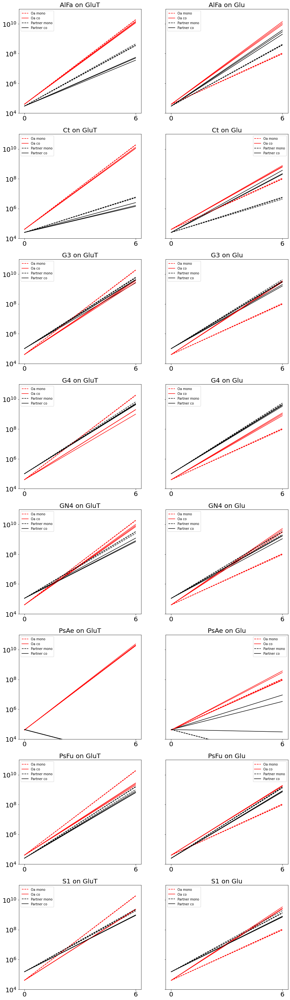

In [31]:
colors = {"Oa": "red", "partner": "black"}

d0_mono = cfu_df.query("day == 0 and culture == 'mono'").set_index("strain")["CFUs"]

fig, ax = plt.subplots(npartners, nmedia, figsize=(15, 7 * npartners), sharey=True)

for i, partner in enumerate(partners):

    for m, condition in enumerate(media):

        for rep in range(1, nreplicates + 1):

            # Oa mono
            ax[i, m].plot([0, 6],[d0_mono["Oa"],get_cfus(cfu_df, 6, condition, "mono", strain="Oa", replicate=rep)],color="red",linestyle="dashed",label="Oa mono" if rep == 1 else "")

            # Oa co
            ax[i, m].plot([0, 6],[d0_mono["Oa"],get_cfus(cfu_df, 6, condition, "co", partner=partner, replicate=rep)],color="red",label="Oa co" if rep == 1 else "")

            # Partner mono
            ax[i, m].plot([0, 6],[d0_mono[partner],get_cfus(cfu_df, 6, condition, "mono", strain=partner, replicate=rep)],color="black",linestyle="dashed",label="Partner mono" if rep == 1 else "")

            # Partner co
            ax[i, m].plot([0, 6],[d0_mono[partner],get_cfus(cfu_df, 6, condition, "co", strain=partner, partner="Oa", replicate=rep)],color="black",label="Partner co" if rep == 1 else "")

        ax[i, m].set_yscale("log")
        ax[i, m].set_ylim(1e4, 1e11)
        ax[i, m].set_title(f"{partner} on {media_titles[m]}", fontsize=20)
        ax[i,m].set_xticks([0, 6])
        ax[i, m].legend()
plt.savefig(plot_dir / "Glu_all_interactions.png", dpi=300, bbox_inches="tight")
plt.show()

In [32]:
cfu_df["oa_on_p"] = cfu_df[cfu_df["culture"]=="co"].apply(lambda row: get_p_on_oa(cfu_df,row["condition"], row["partner"], row["replicate"]), axis=1)
cfu_df["p_on_oa"] = cfu_df[cfu_df["culture"]=="co"].apply(lambda row: get_oa_on_p(cfu_df, row["condition"], row["partner"], row["replicate"]), axis=1)

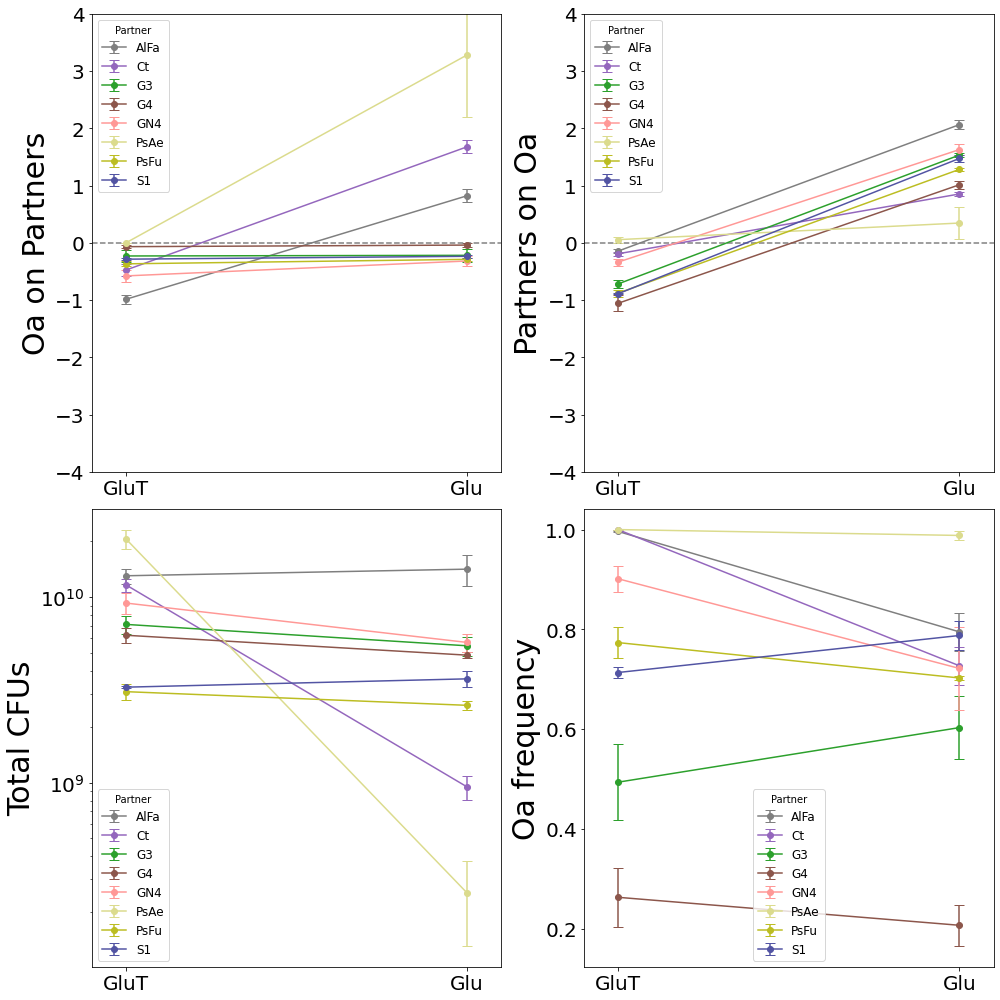

In [33]:
fig, ax = plt.subplots(ncols=2,nrows=2,figsize=(14,14))

for partner in partners:

    # Oa on Partners
    mean_oa_on_p_fat = np.mean([get_oa_on_p(cfu_df, media[0], partner, rep) for rep in range(1, nreplicates + 1)])
    std_oa_on_p_fat = np.std([get_oa_on_p(cfu_df, media[0], partner, rep) for rep in range(1, nreplicates + 1)])

    mean_oa_on_p_fa = np.mean([get_oa_on_p(cfu_df, media[1], partner, rep) for rep in range(1, nreplicates + 1)])
    std_oa_on_p_fa = np.std([get_oa_on_p(cfu_df, media[1], partner, rep) for rep in range(1, nreplicates + 1)])

    # Partners on Oa
    mean_p_on_oa_fat = np.mean([get_p_on_oa(cfu_df, media[0], partner, rep) for rep in range(1, nreplicates + 1)])
    std_p_on_oa_fat = np.std([get_p_on_oa(cfu_df, media[0], partner, rep) for rep in range(1, nreplicates + 1)])

    mean_p_on_oa_fa = np.mean([get_p_on_oa(cfu_df, media[1], partner, rep) for rep in range(1, nreplicates + 1)])
    std_p_on_oa_fa = np.std([get_p_on_oa(cfu_df, media[1], partner, rep) for rep in range(1, nreplicates + 1)])

    # Oa frequency
    mean_oa_freq_fat = np.mean([get_oa_freq(cfu_df, media[0], partner, rep) for rep in range(1, nreplicates + 1)])
    std_oa_freq_fat = np.std([get_oa_freq(cfu_df, media[0], partner, rep) for rep in range(1, nreplicates + 1)])

    mean_oa_freq_fa = np.mean([get_oa_freq(cfu_df, media[1], partner, rep) for rep in range(1, nreplicates + 1)])
    std_oa_freq_fa = np.std([get_oa_freq(cfu_df, media[1], partner, rep) for rep in range(1, nreplicates + 1)])

    # Total CFUs
    mean_cfu_fat = np.mean([get_total_cfu(cfu_df, media[0], partner, rep) for rep in range(1, nreplicates + 1)])
    std_cfu_fat = np.std([get_total_cfu(cfu_df, media[0], partner, rep) for rep in range(1, nreplicates + 1)])

    mean_cfu_fa = np.mean([get_total_cfu(cfu_df, media[1], partner, rep) for rep in range(1, nreplicates + 1)])
    std_cfu_fa = np.std([get_total_cfu(cfu_df, media[1], partner, rep) for rep in range(1, nreplicates + 1)])

    # Plots
    ax[0,0].errorbar([0, 1],[mean_oa_on_p_fat, mean_oa_on_p_fa],yerr=[std_oa_on_p_fat, std_oa_on_p_fa],marker="o",linestyle="-",capsize=5,label=partner,color=color_dict[partner],ecolor=color_dict[partner])
    ax[0,1].errorbar([0, 1],[mean_p_on_oa_fat, mean_p_on_oa_fa],yerr=[std_p_on_oa_fat, std_p_on_oa_fa],marker="o",linestyle="-",capsize=5,label=partner,color=color_dict[partner],ecolor=color_dict[partner])  
    ax[1,0].errorbar([0, 1],[mean_cfu_fat, mean_cfu_fa],yerr=[std_cfu_fat, std_cfu_fa],marker="o",linestyle="-",capsize=5,label=partner,color=color_dict[partner],ecolor=color_dict[partner])  
    ax[1,1].errorbar([0, 1],[mean_oa_freq_fat, mean_oa_freq_fa],yerr=[std_oa_freq_fat, std_oa_freq_fa],marker="o",linestyle="-",capsize=5,label=partner,color=color_dict[partner],ecolor=color_dict[partner])


ax[0,0].set_ylabel("Oa on Partners")
ax[0,1].set_ylabel("Partners on Oa")
ax[1,0].set_ylabel("Total CFUs")
ax[1,1].set_ylabel("Oa frequency")
ax[0,0].axhline(0, color="gray", linestyle="dashed")
ax[0,1].axhline(0, color="gray", linestyle="dashed")
ax[0,0].set_ylim(-4, 4)
ax[0,1].set_ylim(ax[0,0].get_ylim())
ax[1,0].set_yscale("log")

for a in ax.flatten():
    a.set_xticks([0, 1])
    a.set_xticklabels(media_titles)
    a.set_xlim(-0.1, 1.1)
    a.legend(title="Partner",fontsize=12)

plt.tight_layout()
plt.savefig(plot_dir / "Glu_interactions_cfus_summary.png")
plt.show()

In [34]:
mean_cfu_fat = np.mean([get_total_cfu(cfu_df, media[0], "AlFa", rep) for rep in range(1, nreplicates + 1)])
mean_cfu_fa = np.mean([get_total_cfu(cfu_df, media[1], "AlFa", rep) for rep in range(1, nreplicates + 1)])
print(f"Mean CFU AlFa on GluT: {mean_cfu_fat}")
print(f"Mean CFU AlFa on Glu: {mean_cfu_fa}")

Mean CFU AlFa on GluT: 13047333333.333334
Mean CFU AlFa on Glu: 14166666666.666666


In [35]:
mean_oa_freq_fat = np.mean([get_oa_freq(cfu_df, media[0], "G3", rep) for rep in range(1, nreplicates + 1)])
mean_oa_freq_fa = np.mean([get_oa_freq(cfu_df, media[1], "G3", rep) for rep in range(1, nreplicates + 1)])
print(f"Mean Oa frequency on G3 on GluT: {mean_oa_freq_fat}")
print(f"Mean Oa frequency on G3 on Glu: {mean_oa_freq_fa}")

Mean Oa frequency on G3 on GluT: 0.49372806599319796
Mean Oa frequency on G3 on Glu: 0.6031204148325997


## Full colonies

In [36]:
# Image paths
# Note that for Glucose we have images of OaAlone available, but I do not import them for this analysis
paths_full_fa = [p for p in glob.glob(str(raw_data_dir / "FullCols" / "*.czi")) if not p.endswith("T.czi") and "OaAlone" not in p and "BUONA" not in p]
paths_full_fa.sort()
paths_full_fat = [p for p in glob.glob(str(raw_data_dir / 'FullCols' / '*T.czi')) if "OaAlone" not in p]
paths_full_fat.sort()
print(paths_full_fa)
print(paths_full_fat)
if len(paths_full_fa) != len(paths_full_fat):
    raise ValueError("Number of FA and FAT full colony images do not match.")

['/home/alessia/Documents/PhD/Colony-project/raw_data/20260615_D5_GLUCOSE/FullCols/AlFa.czi', '/home/alessia/Documents/PhD/Colony-project/raw_data/20260615_D5_GLUCOSE/FullCols/Ct.czi', '/home/alessia/Documents/PhD/Colony-project/raw_data/20260615_D5_GLUCOSE/FullCols/G3.czi', '/home/alessia/Documents/PhD/Colony-project/raw_data/20260615_D5_GLUCOSE/FullCols/G4.czi', '/home/alessia/Documents/PhD/Colony-project/raw_data/20260615_D5_GLUCOSE/FullCols/GN4.czi', '/home/alessia/Documents/PhD/Colony-project/raw_data/20260615_D5_GLUCOSE/FullCols/PsAe.czi', '/home/alessia/Documents/PhD/Colony-project/raw_data/20260615_D5_GLUCOSE/FullCols/PsFu.czi', '/home/alessia/Documents/PhD/Colony-project/raw_data/20260615_D5_GLUCOSE/FullCols/S1.czi']
['/home/alessia/Documents/PhD/Colony-project/raw_data/20260615_D5_GLUCOSE/FullCols/AlFaT.czi', '/home/alessia/Documents/PhD/Colony-project/raw_data/20260615_D5_GLUCOSE/FullCols/CtT.czi', '/home/alessia/Documents/PhD/Colony-project/raw_data/20260615_D5_GLUCOSE/Full

In [37]:
# Load images
ims_full_fa = [np.squeeze(aics.AICSImage(im_path).get_image_data()) for im_path in paths_full_fa]
ims_full_fat = [np.squeeze(aics.AICSImage(im_path).get_image_data()) for im_path in paths_full_fat]

# Get partner names from image paths
partners = [s.replace(str(raw_data_dir),'').replace('/FullCols/','') for s in paths_full_fa]
partners = [s.replace('.czi','') for s in partners]
print(partners)

['AlFa', 'Ct', 'G3', 'G4', 'GN4', 'PsAe', 'PsFu', 'S1']


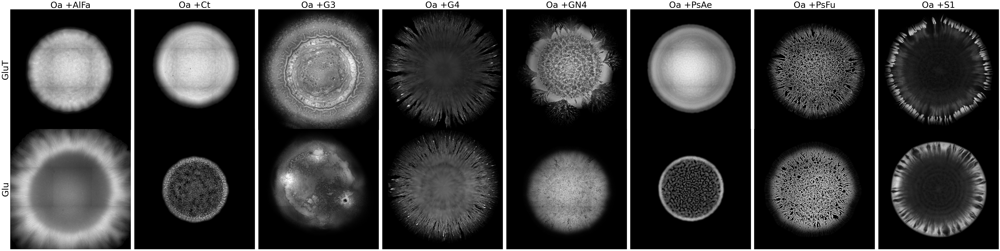

In [38]:
# Plot full colonies
option = "horizontal"
if option == "vertical":
    fig, ax = plt.subplots(nrows=npartners, ncols=2, figsize=(20, 10*npartners))
    for i in range(npartners):
        ax[i,0].imshow(ims_full_fat[i][chan_r,:,:],cmap="gray")
        ax[i,1].imshow(ims_full_fa[i][chan_r,:,:],cmap="gray")
        ax[i,0].set_title("Oa +" + partners[i] + " on GluT",fontsize=20)
        ax[i,1].set_title("Oa +" + partners[i] + " on Glu",fontsize=20)
        ax[i,0].axis('off')
        ax[i,1].axis('off')
elif option == "horizontal":
    fig, ax = plt.subplots(nrows=2, ncols=npartners, figsize=(10*npartners, 20))
    for i in range(npartners):
        ax[0,i].imshow(ims_full_fat[i][chan_r,:,:],cmap="gray")
        ax[1,i].imshow(ims_full_fa[i][chan_r,:,:],cmap="gray")
        ax[0,i].set_title("Oa +" + partners[i],fontsize=50)
        ax[0,i].set_xticks([])
        ax[1,i].set_xticks([])
        ax[0,i].set_yticks([])
        ax[1,i].set_yticks([])
    ax[0,0].set_ylabel("GluT",fontsize=50)
    ax[1,0].set_ylabel("Glu",fontsize=50)
plt.tight_layout()
plt.savefig(plot_dir / f"Glu_full_colonies_{option}.png", dpi=300, bbox_inches="tight")
plt.show()

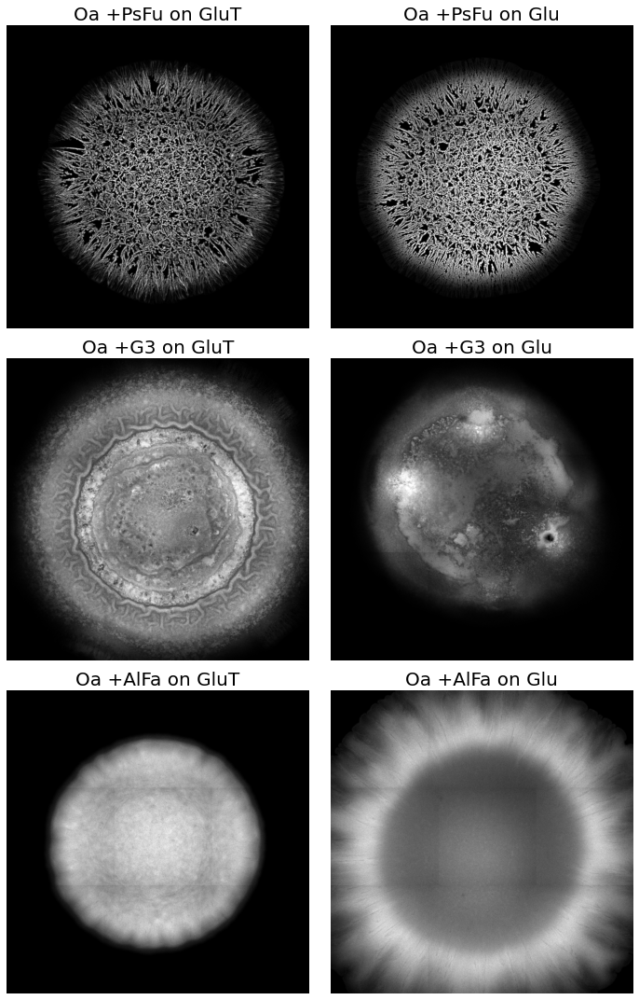

In [39]:
# Plot AlFA, G3 and PsFu
indices = np.array([np.where(np.array(partners) == p)[0][0] for p in ["PsFu","G3","AlFa"]])
fig, ax = plt.subplots(nrows=3, ncols=2, figsize=(10, 5*len(indices)))
for i, idx in enumerate(indices):
    ax[i,0].imshow(ims_full_fat[idx][chan_r,:,:],cmap="gray")
    ax[i,1].imshow(ims_full_fa[idx][chan_r,:,:],cmap="gray")
    ax[i,0].set_title("Oa +" + partners[idx] + " on GluT",fontsize=20)
    ax[i,1].set_title("Oa +" + partners[idx] + " on Glu",fontsize=20)
    ax[i,0].axis('off')
    ax[i,1].axis('off')
plt.tight_layout()
plt.savefig(plot_dir / f"Glu_full_colonies_examples.png", dpi=300, bbox_inches="tight")
plt.show()

## Closeups

In [40]:
# Image paths for closeups
paths_closeup = list((raw_data_dir / "CloseUps").glob("*.czi"))
paths_closeup_fat = [f for f in paths_closeup if re.fullmatch(r".*T\d+\.czi", f.name) and "OaAlone" not in f.name]
paths_closeup_fa = [f for f in paths_closeup if f not in paths_closeup_fat and "OaAlone" not in f.name]
if len(paths_closeup_fa) != len(paths_closeup_fat):
    raise ValueError("Number of FA and FAT closeup images do not match.")
paths_closeup_fa.sort()
paths_closeup_fat.sort()

# Load closeup images
ims_closeup_fa = [np.squeeze(aics.AICSImage(im_path).get_image_data()) for im_path in paths_closeup_fa]
ims_closeup_fat = [np.squeeze(aics.AICSImage(im_path).get_image_data()) for im_path in paths_closeup_fat]

# Normalize closeup images
normalize_save_images = False
savenames_fa = [str(pathlib.Path(path).name[:-5] + "_closeup_norm_Glu_" + pathlib.Path(path).name[-5:]).replace(".czi", ".tiff") for path in paths_closeup_fa]
savenames_fat = [str(pathlib.Path(path).name[:-5] + "_closeup_norm_GluT_" + pathlib.Path(path).name[-5:]).replace(".czi", ".tiff") for path in paths_closeup_fat]
if normalize_save_images:
    ims_closeup_fa_norm = [normalize_image_global(img[chan_r]) for img in ims_closeup_fa]
    ims_closeup_fat_norm = [normalize_image_global(img[chan_r]) for img in ims_closeup_fat]
    for i in range(len(ims_closeup_fa_norm)):
        tifffile.imwrite(proc_data_dir / savenames_fa[i], ims_closeup_fa_norm[i])
        tifffile.imwrite(proc_data_dir / savenames_fat[i], ims_closeup_fat_norm[i])
else:
    ims_closeup_fa_norm = [tifffile.imread(proc_data_dir / savenames_fa[i]) for i in range(len(savenames_fa))]
    ims_closeup_fat_norm = [tifffile.imread(proc_data_dir / savenames_fat[i]) for i in range(len(savenames_fat))]

In [41]:
raw_data_dir

PosixPath('/home/alessia/Documents/PhD/Colony-project/raw_data/20260615_D5_GLUCOSE')

In [42]:
# Load closeup images of Oa
path_closeup_oa = glob.glob(str(raw_data_dir / "CloseUps" / "*Oa*.czi"))
path_closeup_oa_fat = [path for path in path_closeup_oa if "T" in path]
path_closeup_oa_fa = [path for path in path_closeup_oa if "T" not in path]

print(f"Found {len(path_closeup_oa_fa)} FA closeup images of Oa and {len(path_closeup_oa_fat)} FAT closeup images of Oa.")
print(path_closeup_oa_fa)
print(path_closeup_oa_fat)

ims_closeup_oa_fa = [np.squeeze(aics.AICSImage(im_path).get_image_data()) for im_path in path_closeup_oa_fa]
ims_closeup_oa_fat = [np.squeeze(aics.AICSImage(im_path).get_image_data()) for im_path in path_closeup_oa_fat]

ims_closeup_oa_fa_norm = [normalize_image_global(img[chan_r]) for img in ims_closeup_oa_fa]
ims_closeup_oa_fat_norm = [normalize_image_global(img[chan_r]) for img in ims_closeup_oa_fat]

Found 3 FA closeup images of Oa and 3 FAT closeup images of Oa.
['/home/alessia/Documents/PhD/Colony-project/raw_data/20260615_D5_GLUCOSE/CloseUps/OaAlone3.czi', '/home/alessia/Documents/PhD/Colony-project/raw_data/20260615_D5_GLUCOSE/CloseUps/OaAlone1.czi', '/home/alessia/Documents/PhD/Colony-project/raw_data/20260615_D5_GLUCOSE/CloseUps/OaAlone2.czi']
['/home/alessia/Documents/PhD/Colony-project/raw_data/20260615_D5_GLUCOSE/CloseUps/OaAloneT2.czi', '/home/alessia/Documents/PhD/Colony-project/raw_data/20260615_D5_GLUCOSE/CloseUps/OaAloneT3.czi', '/home/alessia/Documents/PhD/Colony-project/raw_data/20260615_D5_GLUCOSE/CloseUps/OaAloneT1.czi']


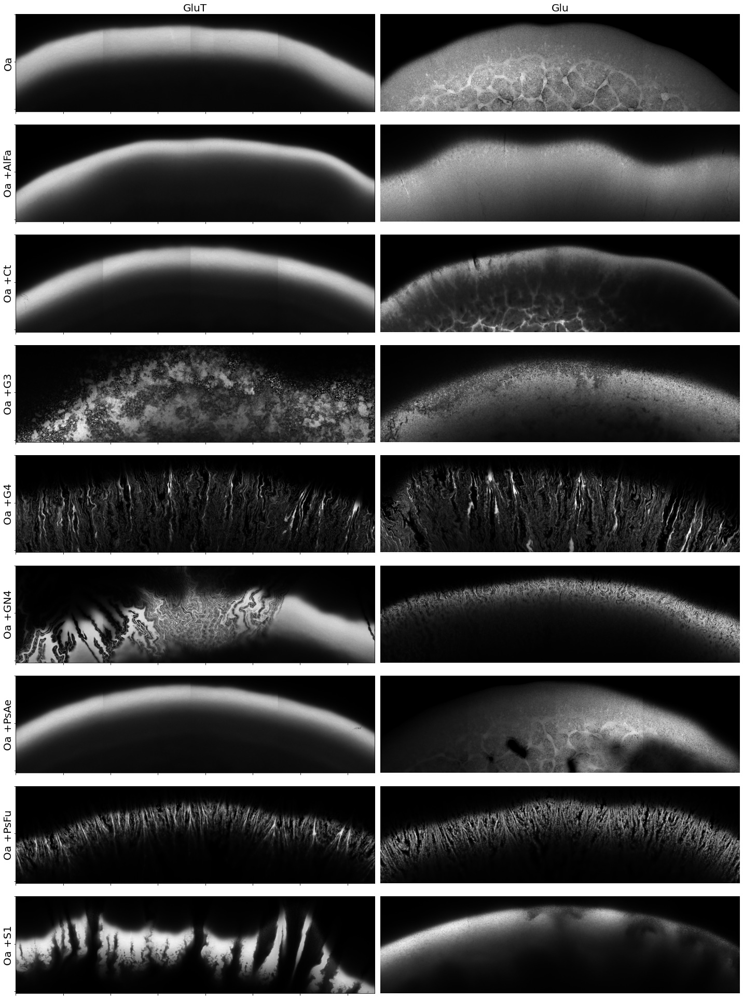

In [43]:
# Print normalized images
# Note that I am plotting the first replicate
option = "vertical"
if option == "vertical":
    fig, ax = plt.subplots(9, 2, figsize=(10*2,3*9))
    ax[0,0].imshow(ims_closeup_oa_fat_norm[0],cmap='gray')
    ax[0,1].imshow(ims_closeup_oa_fa_norm[0],cmap='gray')
    ax[0,0].set_ylabel("Oa",fontsize=20)
    ax[0,1].set_ylabel("")
    ax[0,0].tick_params(axis='x', labelbottom=False)  # Hide x tick labels
    ax[0,0].tick_params(axis='y', labelleft=False)    # Hide y tick labels
    ax[0,1].axis('off')
    for i in range(8):
        ax[i+1,0].imshow(ims_closeup_fat_norm[3*i],cmap='gray')
        ax[i+1,1].imshow(ims_closeup_fa_norm[3*i],cmap='gray')
        ax[i+1,0].set_ylabel("Oa +" + partners[i],fontsize=20)
        ax[i+1,1].set_ylabel("")
        ax[i+1,0].tick_params(axis='x', labelbottom=False)  # Hide x tick labels
        ax[i+1,0].tick_params(axis='y', labelleft=False)    # Hide y tick labels
        ax[i+1,1].axis('off')
    ax[0,0].set_title(media_titles[0],fontsize=20)
    ax[0,1].set_title(media_titles[1],fontsize=20)
elif option == "horizontal":
    fig, ax = plt.subplots(2, 8, figsize=(3*8, 2))
    for i in range(8):
        ax[0,i].imshow(ims_closeup_fat_norm[3*i],cmap='gray')
        ax[1,i].imshow(ims_closeup_fa_norm[3*i],cmap='gray')
        ax[0,i].set_title("Oa +" + partners[i],fontsize=20)
        ax[0,i].set_xticks([])
        ax[1,i].set_xticks([])
        ax[0,i].set_yticks([])
        ax[1,i].set_yticks([])
    ax[0,0].set_ylabel(media_titles[0],fontsize=20)
    ax[1,0].set_ylabel(media_titles[1],fontsize=20)
plt.savefig(plot_dir / f"{media_titles[1]}_closeups.png", dpi=300, bbox_inches="tight")
plt.tight_layout()
plt.show()

## Load probabilities from Ilastik project

In [44]:
fat_prob_paths = [str(str(proc_data_dir) + "/" + partner + f"T_closeup_norm_GluT_{i}_Probabilities.h5") for i in range(1,nreplicates+1) for partner in partners]
fa_prob_paths = [str(str(proc_data_dir) + "/" + partner + f"_closeup_norm_Glu_{i}_Probabilities.h5") for i in range(1,nreplicates+1) for partner in partners]
fat_prob_paths.sort()
fa_prob_paths.sort()
if len(fat_prob_paths) != len(fa_prob_paths):
    raise ValueError("Number of Glu and GluT probability files do not match.")
else:
    print(f"Found {len(fat_prob_paths)} GluT probability files and {len(fa_prob_paths)} Glu probability files.")

Found 24 GluT probability files and 24 Glu probability files.


In [45]:
thresholds_to_try = np.linspace(0,1,101)
chosen_thr = 80 #67
npartners = len(partners)
# Load all probabilities
fat_prob = [h5py.File(fat_prob_paths[i], 'r')['exported_data'][:,:,0] for i in range(nreplicates*npartners)]
fa_prob = [h5py.File(fa_prob_paths[i], 'r')['exported_data'][:,:,0] for i in range(nreplicates*npartners)]
if len(fat_prob) != len(fa_prob):
    raise ValueError("Number of FAT and FA probability images do not match.")
else:
    print(f"Loaded {len(fat_prob)} FAT and {len(fa_prob)} FA probability images.")
    
# Calculate masks
mask_fat = [(prob > thresholds_to_try[chosen_thr]).astype(int) for prob in fat_prob]
mask_fa = [(prob > thresholds_to_try[chosen_thr]).astype(int) for prob in fa_prob]

Loaded 24 FAT and 24 FA probability images.


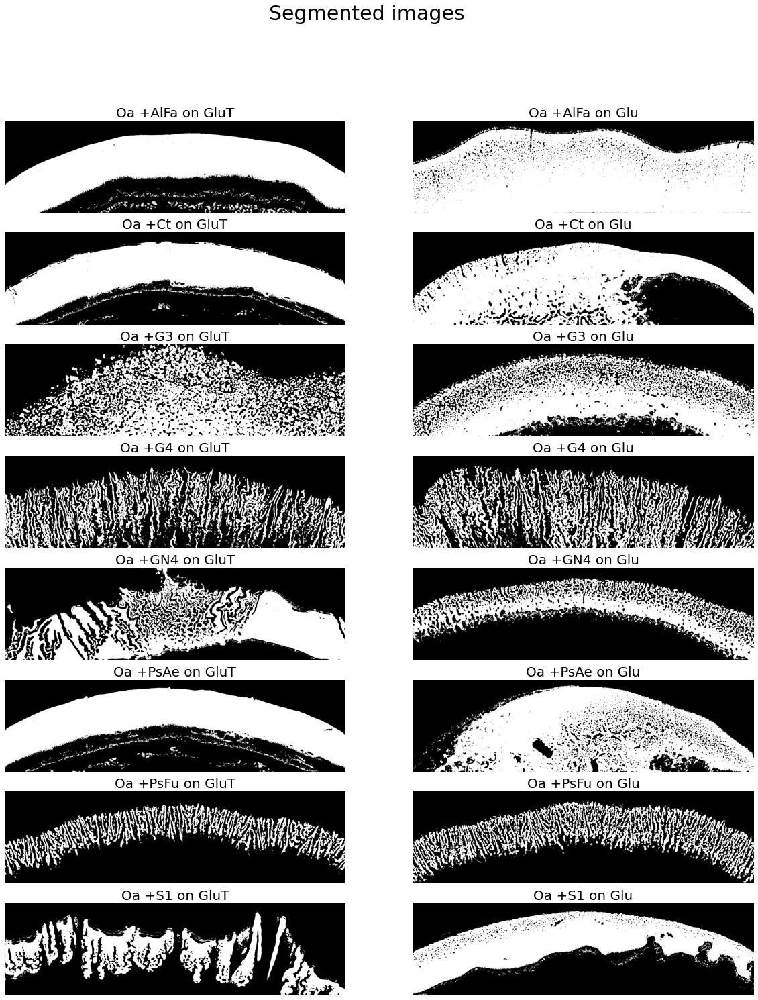

In [46]:
fig, ax = plt.subplots(npartners,2,figsize=(10*2,3*npartners))
for i in range(npartners):
    ax[i,0].imshow(mask_fat[3*i],cmap='gray')
    ax[i,1].imshow(mask_fa[3*i],cmap='gray')
    ax[i,0].set_title("Oa +" + partners[i] + " on GluT",fontsize=20)
    ax[i,1].set_title("Oa +" + partners[i] + " on Glu",fontsize=20)
    ax[i,0].axis('off')
    ax[i,1].axis('off')
plt.suptitle("Segmented images",fontsize=30)
plt.show()

## Load in-focus masks

In [47]:
fat_focus_mask_paths = [str(str(proc_data_dir) + "/" + partner + f"T_focus_mask_GluT_{i}.tiff") for i in range(1,nreplicates+1) for partner in partners]
fa_focus_mask_paths = [str(str(proc_data_dir) + "/" + partner + f"_focus_mask_Glu_{i}.tiff") for i in range(1,nreplicates+1) for partner in partners]
fat_focus_mask_paths.sort()
fa_focus_mask_paths.sort()
if len(fat_focus_mask_paths) != len(fa_focus_mask_paths):
    raise ValueError("Number of Glu and GluT focus mask images do not match.")
else:
    print(f"Found {len(fat_focus_mask_paths)} GluT focus mask images and {len(fa_focus_mask_paths)} Glu focus mask images.")

focus_masks_fat = [tifffile.imread(fat_focus_mask_paths[i]) for i in range(len(fat_focus_mask_paths))]
focus_masks_fa = [tifffile.imread(fa_focus_mask_paths[i]) for i in range(len(fa_focus_mask_paths))]

Found 24 GluT focus mask images and 24 Glu focus mask images.


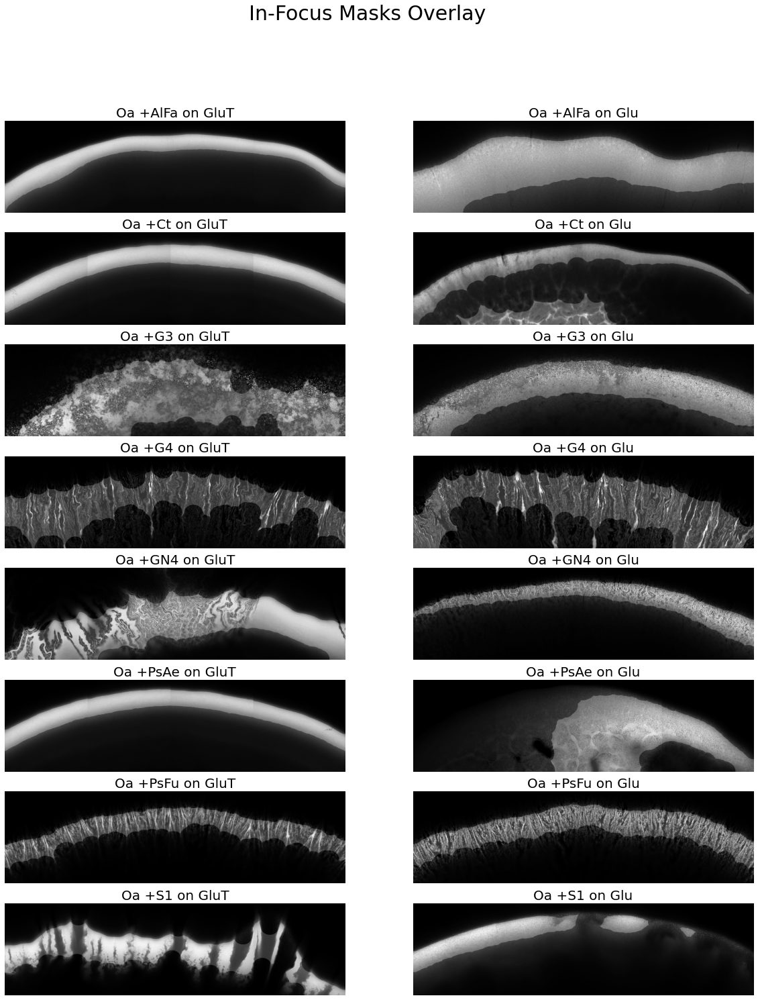

In [48]:
fig, ax = plt.subplots(npartners,2,figsize=(10*2,3*npartners))
for i in range(npartners):
    ax[i,0].imshow(ims_closeup_fat_norm[3*i],cmap='gray')
    ax[i,0].imshow(focus_masks_fat[3*i],cmap='gray',alpha=0.2)
    ax[i,1].imshow(ims_closeup_fa_norm[3*i],cmap='gray')
    ax[i,1].imshow(focus_masks_fa[3*i],cmap='gray',alpha=0.2)
    ax[i,0].set_title("Oa +" + partners[i] + " on GluT",fontsize=20)
    ax[i,1].set_title("Oa +" + partners[i] + " on Glu",fontsize=20)
    ax[i,0].axis('off')
    ax[i,1].axis('off')
plt.suptitle("In-Focus Masks Overlay",fontsize=30)
plt.show()

## Mixing and sector sizes

In [49]:
# Create a dataframe with partners, replicates, media, intermixing, ring, sector size Oa, sector size Partner, Oa frequency
ii_df = pd.DataFrame(columns=["partner", "media", "replicate", "intermixing_indices", "rings", "mean_intermixing", "sector_size_Oa", "sector_size_partner", "oa_frequency"])

for i, partner in enumerate(partners):
    for m, condition in enumerate(media):
        for rep in range(1, nreplicates + 1):

            if condition == "GluT":
                focus_mask = focus_masks_fat[i*nreplicates + (rep-1)]
                oa_mask = mask_fat[i*nreplicates + (rep-1)]
            elif condition == "Glu":
                focus_mask = focus_masks_fa[i*nreplicates + (rep-1)]
                oa_mask = mask_fa[i*nreplicates + (rep-1)]

            ring_distances, pixel_values = get_arcs_in_focus(focus_mask, oa_mask, ring_width=ring_width)
            intermixing_indices = intermixing_index(pixel_values)
            mean_intermixing = np.mean(intermixing_indices[int(0.5*len(intermixing_indices)):])  # mean intermixing index for the outer half of the colony  
            oa_sector_size, partner_sector_size, oa_frequency = sector_size_and_freq(pixel_values)
            oa_sector_size = np.mean(oa_sector_size)
            partner_sector_size = np.mean(partner_sector_size)

            ii_df.loc[len(ii_df)] = [partner, condition, rep, intermixing_indices, ring_distances, mean_intermixing, oa_sector_size, partner_sector_size, oa_frequency]

ii_df.head(2)

,partner,media,replicate,intermixing_indices,rings,mean_intermixing,sector_size_Oa,sector_size_partner,oa_frequency
0,AlFa,GluT,1,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[50.5, 51.5, 52.5, 53.5, 54.5, 55.5, 56.5, 57....",0.0,1342.704965,2.224823,0.999335
1,AlFa,GluT,2,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[50.5, 51.5, 52.5, 53.5, 54.5, 55.5, 56.5, 57....",0.0,1971.245625,7.548125,0.996256


In [50]:
# Save dataframe
if ring_width == 5:
    ii_df.to_csv("glu_image_analysis.csv", index=False)
elif ring_width == 1:
    ii_df.to_csv("glu_image_analysis_ring_1.csv", index=False)

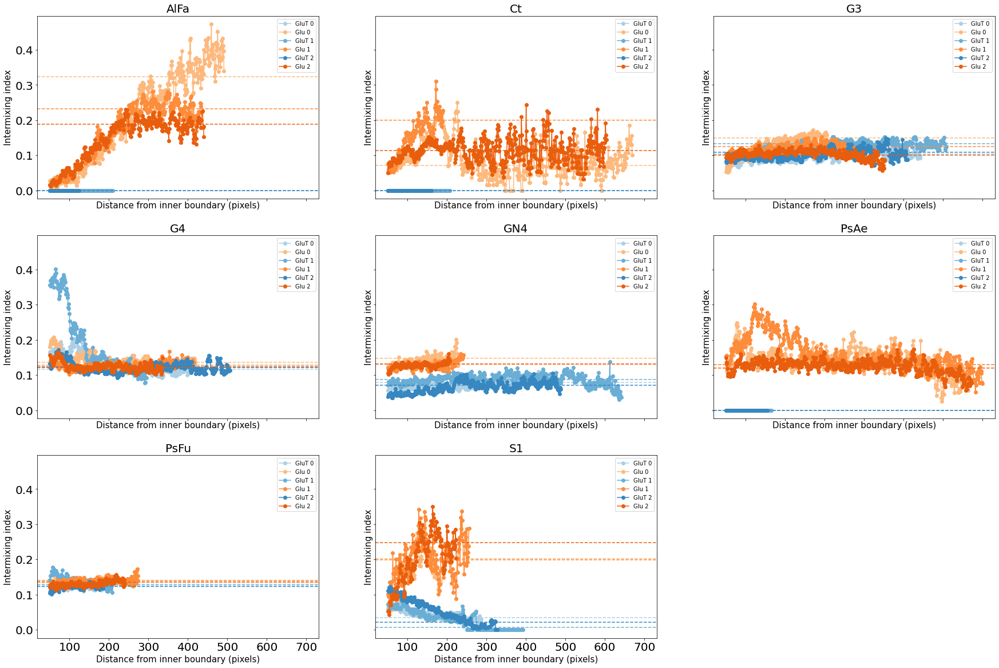

In [51]:
blues = sns.color_palette("Blues", 5)[1:4]      # avoid very pale color
oranges = sns.color_palette("Oranges", 5)[1:4]
fig, axs = plt.subplots(3,3,figsize=(30,20),sharex=True, sharey=True)
ax = axs.flatten()
for i,partner in enumerate(partners):
    idx = partners.index(partner)
    for rep in range(nreplicates):
        row_fat = ii_df[(ii_df["partner"]==partner) & (ii_df["media"]=="GluT") & (ii_df["replicate"]==rep+1)]
        row_fa = ii_df[(ii_df["partner"]==partner) & (ii_df["media"]=="Glu") & (ii_df["replicate"]==rep+1)]
        ring_distances_fat = row_fat["rings"].values[0]
        intermixing_fat = row_fat["intermixing_indices"].values[0]
        mean_intermixing_fat = row_fat["mean_intermixing"].values[0]
        ring_distances_fa = row_fa["rings"].values[0]
        intermixing_fa = row_fa["intermixing_indices"].values[0]
        mean_intermixing_fa = row_fa["mean_intermixing"].values[0]
        ax[i].plot(ring_distances_fat, intermixing_fat, marker='o',label=f"GluT {rep}", color=blues[rep])
        ax[i].axhline(y=mean_intermixing_fat, color=blues[rep], linestyle='--')
        ax[i].plot(ring_distances_fa, intermixing_fa, marker='o',label=f"Glu {rep}", color=oranges[rep])
        ax[i].axhline(y=mean_intermixing_fa, color=oranges[rep], linestyle='--')
    ax[i].set_title(f"{partner}", fontsize=20)
    ax[i].set_xlabel("Distance from inner boundary (pixels)", fontsize=15)
    ax[i].set_ylabel("Intermixing index", fontsize=15)
    ax[i].legend()
for i in range(npartners, len(ax)):
    ax[i].axis('off')
plt.savefig(plot_dir / "Glu_intermixing_vs_pixel.png", dpi=300, bbox_inches="tight")
plt.show()

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
/tmp/ipykernel_21146/4217185347.py:54: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


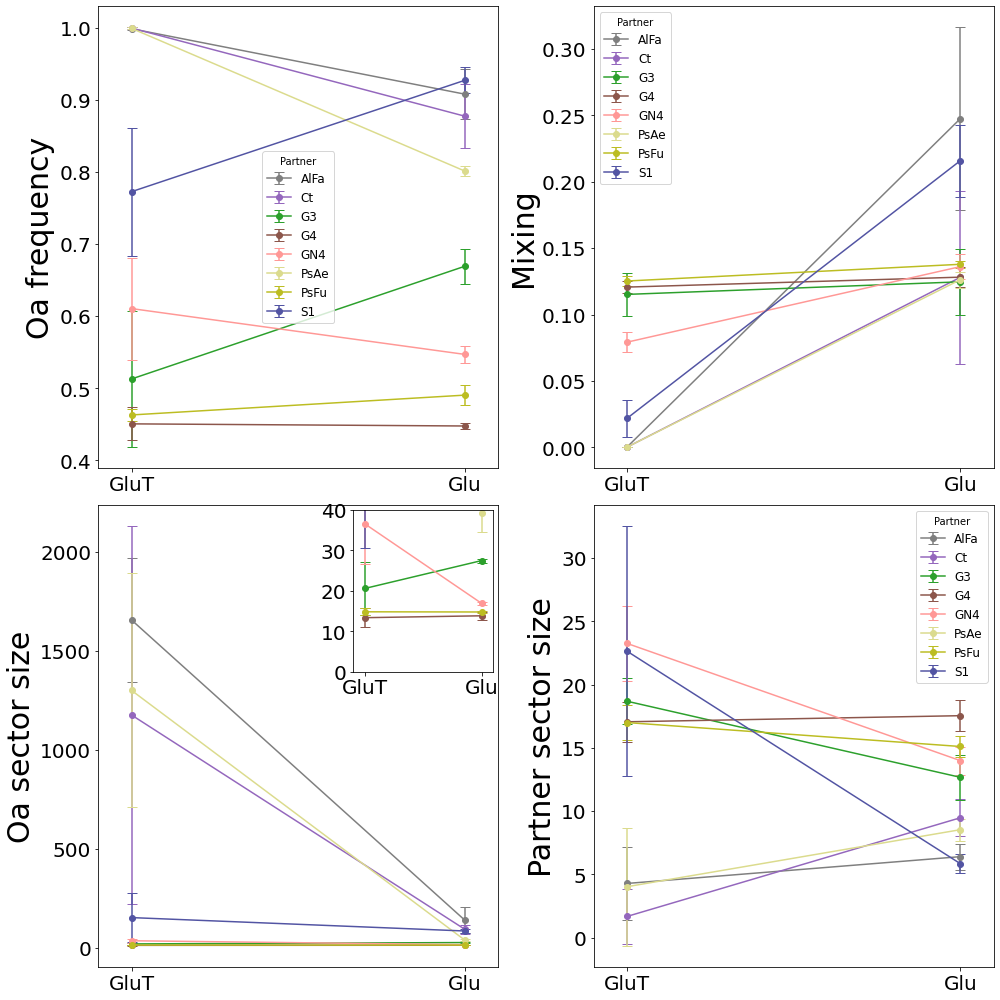

In [52]:
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
fig, ax = plt.subplots(ncols=2,nrows=2,figsize=(14,14))
# Create inset in the top-right corner of Oa sector size plot
axins = inset_axes(ax[1,0], width="35%", height="35%", loc="upper right")

for partner in partners:

    # Oa frequency
    mean_oa_freq_fat = ii_df[(ii_df["partner"]==partner) & (ii_df["media"]=="GluT")]["oa_frequency"].mean()
    std_oa_freq_fat = ii_df[(ii_df["partner"]==partner) & (ii_df["media"]=="GluT")]["oa_frequency"].std()
    mean_oa_freq_fa = ii_df[(ii_df["partner"]==partner) & (ii_df["media"]=="Glu")]["oa_frequency"].mean()
    std_oa_freq_fa = ii_df[(ii_df["partner"]==partner) & (ii_df["media"]=="Glu")]["oa_frequency"].std()

    # Mixing
    mean_mixing_fat = ii_df[(ii_df["partner"]==partner) & (ii_df["media"]=="GluT")]["mean_intermixing"].mean()
    std_mixing_fat = ii_df[(ii_df["partner"]==partner) & (ii_df["media"]=="GluT")]["mean_intermixing"].std()
    mean_mixing_fa = ii_df[(ii_df["partner"]==partner) & (ii_df["media"]=="Glu")]["mean_intermixing"].mean()
    std_mixing_fa = ii_df[(ii_df["partner"]==partner) & (ii_df["media"]=="Glu")]["mean_intermixing"].std()

    # Oa sector size
    mean_oa_sector_size_fat = ii_df[(ii_df["partner"]==partner) & (ii_df["media"]=="GluT")]["sector_size_Oa"].mean()
    std_oa_sector_size_fat = ii_df[(ii_df["partner"]==partner) & (ii_df["media"]=="GluT")]["sector_size_Oa"].std()
    mean_oa_sector_size_fa = ii_df[(ii_df["partner"]==partner) & (ii_df["media"]=="Glu")]["sector_size_Oa"].mean()  
    std_oa_sector_size_fa = ii_df[(ii_df["partner"]==partner) & (ii_df["media"]=="Glu")]["sector_size_Oa"].std()

    # Partner sector size
    mean_partner_sector_size_fat = ii_df[(ii_df["partner"]==partner) & (ii_df["media"]=="GluT")]["sector_size_partner"].mean()
    std_partner_sector_size_fat = ii_df[(ii_df["partner"]==partner) & (ii_df["media"]=="GluT")]["sector_size_partner"].std()
    mean_partner_sector_size_fa = ii_df[(ii_df["partner"]==partner) & (ii_df["media"]=="Glu")]["sector_size_partner"].mean()
    std_partner_sector_size_fa = ii_df[(ii_df["partner"]==partner) & (ii_df["media"]=="Glu")]["sector_size_partner"].std()

    # Plots
    ax[0,0].errorbar([0, 1],[mean_oa_freq_fat, mean_oa_freq_fa],yerr=[std_oa_freq_fat, std_oa_freq_fa],marker="o",linestyle="-",capsize=5,label=partner,color=color_dict[partner],ecolor=color_dict[partner])
    ax[0,1].errorbar([0, 1],[mean_mixing_fat, mean_mixing_fa],yerr=[std_mixing_fat, std_mixing_fa],marker="o",linestyle="-",capsize=5,label=partner,color=color_dict[partner],ecolor=color_dict[partner])  
    ax[1,0].errorbar([0, 1],[mean_oa_sector_size_fat, mean_oa_sector_size_fa],yerr=[std_oa_sector_size_fat, std_oa_sector_size_fa],marker="o",linestyle="-",capsize=5,color=color_dict[partner],ecolor=color_dict[partner])  
    ax[1,1].errorbar([0, 1],[mean_partner_sector_size_fat, mean_partner_sector_size_fa],yerr=[std_partner_sector_size_fat, std_partner_sector_size_fa],marker="o",linestyle="-",capsize=5,label=partner,color=color_dict[partner],ecolor=color_dict[partner])
    axins.errorbar([0, 1],[mean_oa_sector_size_fat, mean_oa_sector_size_fa],yerr=[std_oa_sector_size_fat, std_oa_sector_size_fa],marker="o",linestyle="-",capsize=5,color=color_dict[partner],ecolor=color_dict[partner])  

ax[0,0].set_ylabel("Oa frequency")
ax[0,1].set_ylabel("Mixing")
ax[1,0].set_ylabel("Oa sector size")
ax[1,1].set_ylabel("Partner sector size")
axins. set_ylim(0,40)
axins.set_xticks([0, 1])
axins.set_xticklabels(media_titles)
axins.set_xlim(-0.1, 1.1)

for a in ax.flatten():
    a.set_xticks([0, 1])
    a.set_xticklabels(media_titles)
    a.set_xlim(-0.1, 1.1)
    a.legend(title="Partner",fontsize=12)

plt.tight_layout()
plt.savefig(plot_dir / "Glu_image_analysis_summary.png")
plt.show()